In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import nltk.corpus
import nltk
from nltk.corpus import stopwords
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from tqdm import tqdm
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import re
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer
from collections import Counter
import sklearn
from sklearn.model_selection import KFold
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
import sklearn.cluster as cluster
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score
from random import randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier

In [6]:
!pip install wordcloud

In [4]:
from google.colab import drive 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
cd /content/drive

[Errno 2] No such file or directory: '/content/drive'
/Users/shivamsrivastav/Desktop/Fall 21/Machine Learning/Project


In [8]:
cd MyDrive/ML Data

[Errno 2] No such file or directory: 'MyDrive/ML Data'
/Users/shivamsrivastav/Desktop/Fall 21/Machine Learning/Project


In [2]:
Pers_df = pd.read_csv("mbti_1.csv")

In [3]:
Pers_df

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...
...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...
8671,ENFP,'So...if this thread already exists someplace ...
8672,INTP,'So many questions when i do these things. I ...
8673,INFP,'I am very conflicted right now when it comes ...


In [4]:
Pers_df.head()

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...


In [5]:
Pers_df[Pers_df['type']=="INFJ"].count()


type     1470
posts    1470
dtype: int64

In [6]:
import warnings

In [7]:
Pers_df_count =Pers_df['type'].value_counts()


/Users/shivamsrivastav/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


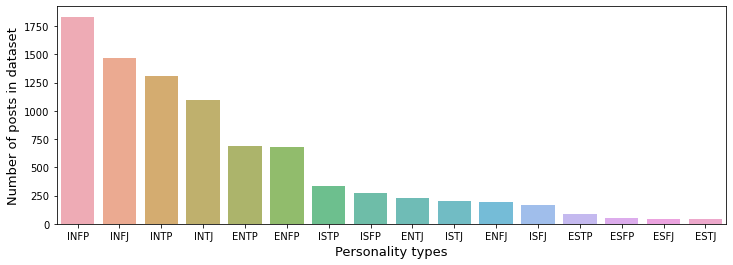

In [8]:
plt.figure(figsize=(12,4))
sns.barplot(Pers_df_count.index,Pers_df_count.values,alpha=0.8)
plt.xlabel('Personality types',fontsize=13)
plt.ylabel("Number of posts in dataset",fontsize=13)
plt.show()

In [ ]:
fig = plt.figure(figsize = (10,7))
plt.pie(count_list,labels = counttype_list)

NameError: ignored

<Figure size 720x504 with 0 Axes>

In [9]:
px.pie(Pers_df,names='type',title = 'Personality split',hole = 0.3)


Highly Imbalanced data


In [10]:
#text preprocessing
Pers_df['type']

0       INFJ
1       ENTP
2       INTP
3       INTJ
4       ENTJ
        ... 
8670    ISFP
8671    ENFP
8672    INTP
8673    INFP
8674    INFP
Name: type, Length: 8675, dtype: object

In [13]:
Pers_df['type'] = Pers_df['type'].replace(to_replace=r'http://www.youtube.com/watch?v=qsXHcwe3krw',value='',regex=True )

In [12]:
Pers_df.head()

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...


In [14]:
Pers_df['I/E'] = Pers_df['type'].astype(str).str[0]

In [15]:
Pers_df['I/E']

0       I
1       E
2       I
3       I
4       E
       ..
8670    I
8671    E
8672    I
8673    I
8674    I
Name: I/E, Length: 8675, dtype: object

In [16]:
Pers_df

,type,posts,I/E
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,I
1,ENTP,'I'm finding the lack of me in these posts ver...,E
2,INTP,'Good one _____ https://www.youtube.com/wat...,I
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",I
4,ENTJ,'You're fired.|||That's another silly misconce...,E
...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,I
8671,ENFP,'So...if this thread already exists someplace ...,E
8672,INTP,'So many questions when i do these things. I ...,I
8673,INFP,'I am very conflicted right now when it comes ...,I


In [17]:
Pers_df['I/E'].value_counts()

I    6676
E    1999
Name: I/E, dtype: int64

In [18]:
px.pie(Pers_df,names='I/E',title = 'Keeping it Tacit?',hole = 0.3)

In [19]:
Pers_df['N/S'] = Pers_df['type'].astype(str).str[1]

In [20]:
Pers_df['N/S'].value_counts()

N    7478
S    1197
Name: N/S, dtype: int64

In [21]:
px.pie(Pers_df,names='N/S',title = 'Out of the box intuitions?',hole = 0.3)

In [15]:
Pers_df['T/F'] = Pers_df['type'].astype(str).str[2]

In [23]:
Pers_df['T/F'].value_counts()

F    4694
T    3981
Name: T/F, dtype: int64

In [ ]:
px.pie(Pers_df,names='T/F',title = 'One thinks, other feels',hole = 0.3)

In [22]:
Pers_df['J/P'] = Pers_df['type'].astype(str).str[3]

In [23]:
Pers_df['J/P'].value_counts()

P    5241
J    3434
Name: J/P, dtype: int64

In [ ]:
px.pie(Pers_df,names='T/F',title = 'Open ended creativity than planned schedules',hole = 0.3)

In [17]:
Pers_df

,type,posts,I/E,N/S,T/F,J/P
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,I,N,F,J
1,ENTP,'I'm finding the lack of me in these posts ver...,E,N,T,P
2,INTP,'Good one _____ https://www.youtube.com/wat...,I,N,T,P
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",I,N,T,J
4,ENTJ,'You're fired.|||That's another silly misconce...,E,N,T,J
...,...,...,...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,I,S,F,P
8671,ENFP,'So...if this thread already exists someplace ...,E,N,F,P
8672,INTP,'So many questions when i do these things. I ...,I,N,T,P
8673,INFP,'I am very conflicted right now when it comes ...,I,N,F,P


In [18]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/shivamsrivastav/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [19]:
#Cleaning Text
#remove stop words

stop_words = stopwords.words('english') +['I','acquaintance','act']
Pers_df['posts'] = Pers_df['posts'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
Pers_df['posts']


0       'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1       'I'm finding lack posts alarming.|||Sex boring...
2       'Good one _____ https://www.youtube.com/watch?...
3       'Dear INTP, enjoyed conversation day. Esoteric...
4       'You're fired.|||That's another silly misconce...
                              ...                        
8670    'https://www.youtube.com/watch?v=t8edHB_h908||...
8671    'So...if thread already exists someplace else ...
8672    'So many questions things. would take purple p...
8673    'I conflicted right comes wanting children. ho...
8674    'It long since personalitycafe - although seem...
Name: posts, Length: 8675, dtype: object

In [23]:
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [20]:
Pers_df["posts"] = Pers_df["posts"].str.replace(r's*https?://S+(s+|$)', ' ').str.strip()


/Users/shivamsrivastav/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [21]:
Pers_df

,type,posts,I/E,N/S,T/F,J/P
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,I,N,F,J
1,ENTP,'I'm finding lack posts alarming.|||Sex boring...,E,N,T,P
2,INTP,'Good one _____ https://www.youtube.com/watch?...,I,N,T,P
3,INTJ,"'Dear INTP, enjoyed conversation day. Esoteric...",I,N,T,J
4,ENTJ,'You're fired.|||That's another silly misconce...,E,N,T,J
...,...,...,...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,I,S,F,P
8671,ENFP,'So...if thread already exists someplace else ...,E,N,F,P
8672,INTP,'So many questions things. would take purple p...,I,N,T,P
8673,INFP,'I conflicted right comes wanting children. ho...,I,N,F,P


In [22]:
Pers_df['posts']=Pers_df['posts'].apply(lambda x:re.sub(r"http\S+", "", x))

In [23]:
def clear_text(data):
    data_length=[]
    lemmatizer=WordNetLemmatizer()
    cleaned_text=[]
    for sentence in tqdm(data.posts):
        sentence=sentence.lower()
        
#         removing links from text data
        sentence=re.sub('https?://[^\s<>"]+|www\.[^\s<>"]+',' ',sentence)
    
#         removing other symbols
        sentence=re.sub('[^0-9a-z]',' ',sentence)
    
        
        data_length.append(len(sentence.split()))
        cleaned_text.append(sentence)
    return cleaned_text,data_length

In [24]:
cleaned_text = clear_text(Pers_df)
Pers_df

100%|█████████████████████████████████████| 8675/8675 [00:04<00:00, 1829.03it/s]


,type,posts,I/E,N/S,T/F,J/P
0,INFJ,' intj moments sportscenter top ten plays pr...,I,N,F,J
1,ENTP,'I'm finding lack posts alarming.|||Sex boring...,E,N,T,P
2,INTP,"'Good one _____ course, say know; that's bles...",I,N,T,P
3,INTJ,"'Dear INTP, enjoyed conversation day. Esoteric...",I,N,T,J
4,ENTJ,'You're fired.|||That's another silly misconce...,E,N,T,J
...,...,...,...,...,...,...
8670,ISFP,' always think cats Fi doms reason. websites ...,I,S,F,P
8671,ENFP,'So...if thread already exists someplace else ...,E,N,F,P
8672,INTP,'So many questions things. would take purple p...,I,N,T,P
8673,INFP,'I conflicted right comes wanting children. ho...,I,N,F,P


In [25]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df.posts)
feature_names=vectorizer.get_feature_names()

/Users/shivamsrivastav/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


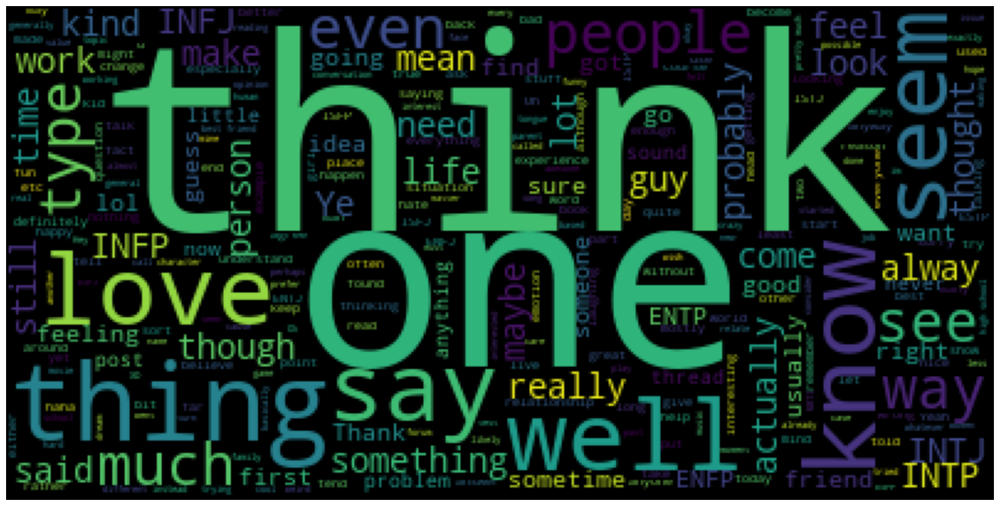

In [ ]:

wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in Pers_df['posts'].astype(str)))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [26]:
str(feature_names)

"['00', '000', '10', '100', '1000', '11', '12', '13', '14', '15', '16', '17', '18', '19', '1st', '1w2', '1w9', '20', '200', '2000', '2010', '2011', '2012', '2013', '20s', '21', '22', '23', '24', '25', '26', '27', '28', '29', '2nd', '2w1', '2w3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '3rd', '3w2', '3w4', '40', '42', '44', '45', '47', '48', '4s', '4th', '4w3', '4w5', '50', '500', '52', '54', '55', '56', '5th', '5w4', '5w6', '60', '65', '6th', '6w5', '6w7', '70', '75', '7w6', '7w8', '80', '85', '8w7', '8w9', '90', '95', '99', '9s', '9w1', '9w8', 'abandoned', 'abilities', 'ability', 'able', 'abortion', 'abroad', 'absence', 'absent', 'absolute', 'absolutely', 'absorbed', 'abstract', 'absurd', 'abuse', 'abused', 'abusive', 'academic', 'accent', 'accept', 'acceptable', 'acceptance', 'accepted', 'accepting', 'access', 'accident', 'accidentally', 'accomplish', 'accomplished', 'according', 'account', 'accounting', 'accounts', 'accuracy', 'accurate', 'accurately', 'accused', 'achi

In [35]:
feature_names[500:3500]

['believed',
 'believer',
 'believes',
 'believing',
 'bell',
 'belle',
 'belong',
 'ben',
 'beneath',
 'beneficial',
 'benefit',
 'benefits',
 'best',
 'bet',
 'beta',
 'better',
 'bf',
 'bi',
 'bias',
 'biased',
 'bible',
 'big',
 'bigger',
 'biggest',
 'bike',
 'billion',
 'bills',
 'biological',
 'biology',
 'bipolar',
 'bird',
 'birds',
 'birth',
 'birthday',
 'bit',
 'bitch',
 'bite',
 'bits',
 'bitter',
 'bizarre',
 'black',
 'blah',
 'blame',
 'blank',
 'blanket',
 'blast',
 'blend',
 'blind',
 'block',
 'blog',
 'blonde',
 'blood',
 'bloody',
 'blow',
 'blowing',
 'blown',
 'blue',
 'blues',
 'blunt',
 'blush',
 'blushed',
 'board',
 'boards',
 'boat',
 'bob',
 'bodies',
 'body',
 'bold',
 'bolded',
 'bomb',
 'bond',
 'bone',
 'bones',
 'book',
 'books',
 'boost',
 'boots',
 'borderline',
 'bore',
 'bored',
 'boredom',
 'boring',
 'born',
 'boss',
 'bossy',
 'bother',
 'bothered',
 'bothering',
 'bothers',
 'bottle',
 'bought',
 'bounce',
 'bound',
 'boundaries',
 'bout',
 'bo

In [27]:
Pers_df_Introvert = Pers_df[Pers_df['I/E']=='I']

In [28]:
Pers_df_Introvert

,type,posts,I/E,N/S,T/F,J/P
0,INFJ,' intj moments sportscenter top ten plays pr...,I,N,F,J
2,INTP,"'Good one _____ course, say know; that's bles...",I,N,T,P
3,INTJ,"'Dear INTP, enjoyed conversation day. Esoteric...",I,N,T,J
5,INTJ,'18/37 @.@|||Science perfect. No scientist cla...,I,N,T,J
6,INFJ,"'No, can't draw nails (haha). Those done profe...",I,N,F,J
...,...,...,...,...,...,...
8669,INFJ,"'I'm sure method picking INFJ musical artists,...",I,N,F,J
8670,ISFP,' always think cats Fi doms reason. websites ...,I,S,F,P
8672,INTP,'So many questions things. would take purple p...,I,N,T,P
8673,INFP,'I conflicted right comes wanting children. ho...,I,N,F,P


In [29]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['I/E']=='I'].posts)
feature_names=vectorizer.get_feature_names()

/Users/shivamsrivastav/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [34]:
#Finding the most common words in Introvert posts.
words = list(Pers_df_Introvert["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 46979),
 ("I'm", 43877),
 ('think', 35316),
 ('people', 27452),
 ('would', 25202),
 ('really', 24163),
 ('know', 23722),
 ('get', 21817),
 ('one', 20558),
 ('-', 17968),
 ('feel', 16932),
 ("I've", 16931),
 ('The', 15892),
 ('much', 14578),
 ('want', 13888),
 ('time', 13627),
 ('say', 12867),
 ('see', 12686),
 ('love', 12478),
 ('good', 12130),
 ('something', 12105),
 ('things', 12016),
 ('always', 11962),
 ('It', 11441),
 ('make', 11243),
 ('even', 10709),
 ('could', 10574),
 ('But', 10553),
 ('way', 10553),
 ('never', 10512),
 ('lot', 10499),
 ('find', 10330),
 ('someone', 10185),
 ('also', 9891),
 ('If', 9736),
 ("It's", 9596),
 ('go', 9576),
 ('going', 8942),
 ("can't", 8864),
 ('it.', 8802),
 ('You', 8751),
 ('And', 8600),
 ('pretty', 8391),
 ('My', 8288),
 ('need', 8278),
 ('actually', 7981),
 ('me.', 7865),
 ('type', 7730),
 ('sure', 7533),
 ('still', 7469)]

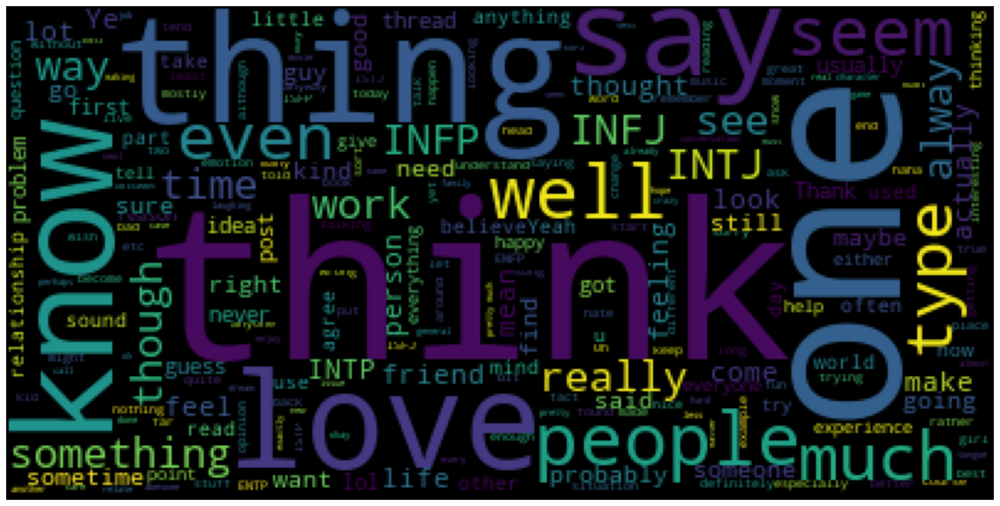

In [ ]:
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in Pers_df_Introvert['posts'].astype(str)))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [30]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['I/E']=='E'].posts)
feature_names=vectorizer.get_feature_names()

In [31]:
Pers_df_Extrovert = Pers_df[Pers_df['I/E']=='E']
Pers_df_Extrovert

,type,posts,I/E,N/S,T/F,J/P
1,ENTP,'I'm finding lack posts alarming.|||Sex boring...,E,N,T,P
4,ENTJ,'You're fired.|||That's another silly misconce...,E,N,T,J
11,ENFJ,' :o|||I went break months ago. We together 4 ...,E,N,F,J
22,ENTJ,"'Now I'm interested. But lazy go research it, ...",E,N,T,J
24,ENTJ,'Still going strong two year mark. made notice...,E,N,T,J
...,...,...,...,...,...,...
8659,ENFP,'leoni really bad social anxiety took medicine...,E,N,F,P
8661,ENTP,'**haven't logged read posts 6 months catching...,E,N,T,P
8665,ENTP,"'This test even close gender, age, MBTI type.|...",E,N,T,P
8667,ENTP,'I think generally people experience post trau...,E,N,T,P


In [44]:
#Finding the most common words in Extroverts posts.
words = list(Pers_df_Extrovert["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 14411),
 ("I'm", 13462),
 ('think', 10913),
 ('people', 8094),
 ('know', 7408),
 ('would', 7403),
 ('really', 7206),
 ('get', 7131),
 ('one', 6234),
 ('-', 5251),
 ("I've", 4840),
 ('feel', 4479),
 ('much', 4386),
 ('The', 4336),
 ('love', 4225),
 ('see', 4148),
 ('want', 4028),
 ('say', 3949),
 ('time', 3856),
 ('good', 3748),
 ('always', 3534),
 ('make', 3527),
 ('things', 3501),
 ('something', 3358),
 ('But', 3321),
 ('could', 3242),
 ('lot', 3174),
 ('way', 3148),
 ('It', 3104),
 ('You', 3051),
 ('even', 3032),
 ('find', 3030),
 ('go', 2933),
 ('someone', 2926),
 ('also', 2912),
 ('never', 2888),
 ('If', 2869),
 ('And', 2812),
 ("It's", 2791),
 ('type', 2716),
 ('pretty', 2715),
 ('going', 2713),
 ("can't", 2555),
 ('need', 2502),
 ('it.', 2497),
 ('actually', 2460),
 ('ENFP', 2402),
 ('sure', 2393),
 ('got', 2326),
 ('My', 2320)]

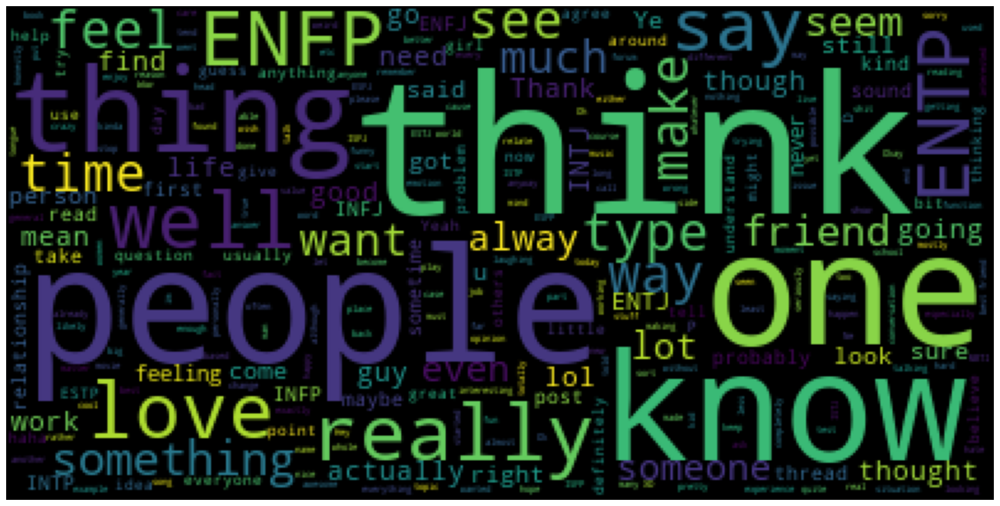

In [ ]:
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in Pers_df_Extrovert['posts'].astype(str)))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [32]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['N/S']=='N'].posts)

TfidfVectorizer(max_features=5000, stop_words='english')

In [33]:
Pers_df_Intuition = Pers_df[Pers_df['N/S']=='N']

In [40]:
#Finding the most common words in Intuition posts.
words = list(Pers_df_Intuition["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 52784),
 ("I'm", 49175),
 ('think', 40094),
 ('people', 31130),
 ('would', 28361),
 ('know', 26960),
 ('really', 26953),
 ('get', 24583),
 ('one', 23346),
 ('-', 20206),
 ('feel', 18871),
 ("I've", 18792),
 ('The', 17587),
 ('much', 16438),
 ('want', 15491),
 ('time', 15061),
 ('love', 14636),
 ('see', 14562),
 ('say', 14483),
 ('good', 13657),
 ('always', 13426),
 ('things', 13285),
 ('something', 13261),
 ('make', 12860),
 ('It', 12723),
 ('could', 12081),
 ('But', 12048),
 ('way', 11954),
 ('even', 11857),
 ('lot', 11810),
 ('find', 11675),
 ('never', 11637),
 ('someone', 11393),
 ('also', 11187),
 ("It's", 10821),
 ('go', 10777),
 ('If', 10751),
 ('You', 10258),
 ('And', 10045),
 ('going', 9999),
 ("can't", 9958),
 ('it.', 9720),
 ('pretty', 9347),
 ('need', 9271),
 ('actually', 9117),
 ('My', 9110),
 ('type', 8725),
 ('me.', 8654),
 ('sure', 8485),
 ('thing', 8249)]

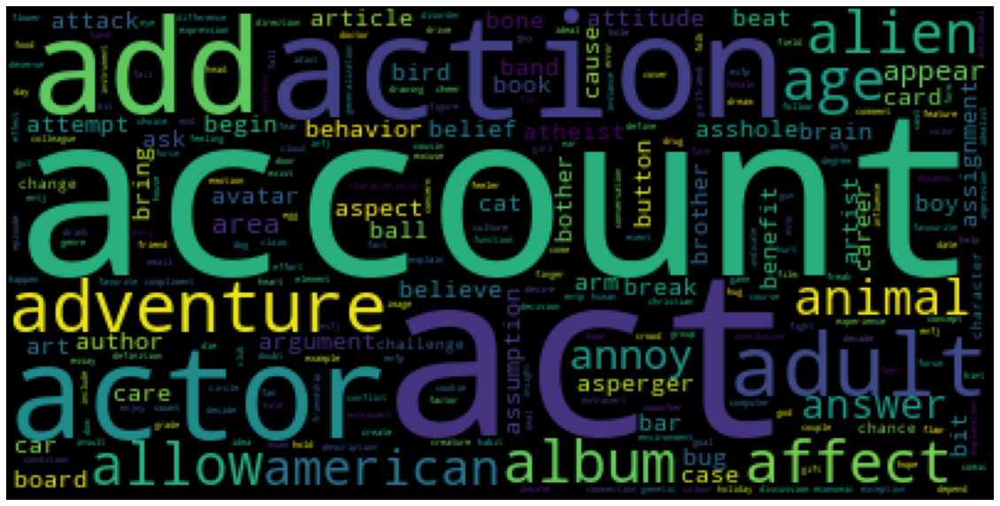

In [ ]:
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[110:3500]))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [34]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['N/S']=='S'].posts)

TfidfVectorizer(max_features=5000, stop_words='english')

In [35]:
Pers_df_Sensing = Pers_df[Pers_df['N/S']=='S']


In [ ]:
#Finding the most common words in Sensing posts.
words = list(Pers_df_Sensing["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 8606),
 ("I'm", 8164),
 ('think', 6135),
 ('people', 4416),
 ('really', 4416),
 ('get', 4365),
 ('would', 4244),
 ('know', 4170),
 ('one', 3446),
 ('-', 3013),
 ("I've", 2979),
 ('The', 2641),
 ('feel', 2540),
 ('much', 2526),
 ('want', 2425),
 ('time', 2422),
 ('say', 2333),
 ('see', 2272),
 ('things', 2232),
 ('good', 2221),
 ('something', 2202),
 ('always', 2070),
 ('love', 2067),
 ('make', 1910),
 ('even', 1884),
 ('lot', 1863),
 ('If', 1854),
 ('But', 1826),
 ('It', 1822),
 ('never', 1763),
 ('pretty', 1759),
 ('way', 1747),
 ('could', 1735),
 ('go', 1732),
 ('type', 1721),
 ('someone', 1718),
 ('find', 1685),
 ('going', 1656),
 ('also', 1616),
 ('it.', 1579),
 ("It's", 1566),
 ('You', 1544),
 ('need', 1509),
 ('My', 1498),
 ("can't", 1461),
 ('sure', 1441),
 ('me.', 1431),
 ('got', 1421),
 ('And', 1367),
 ('actually', 1324)]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



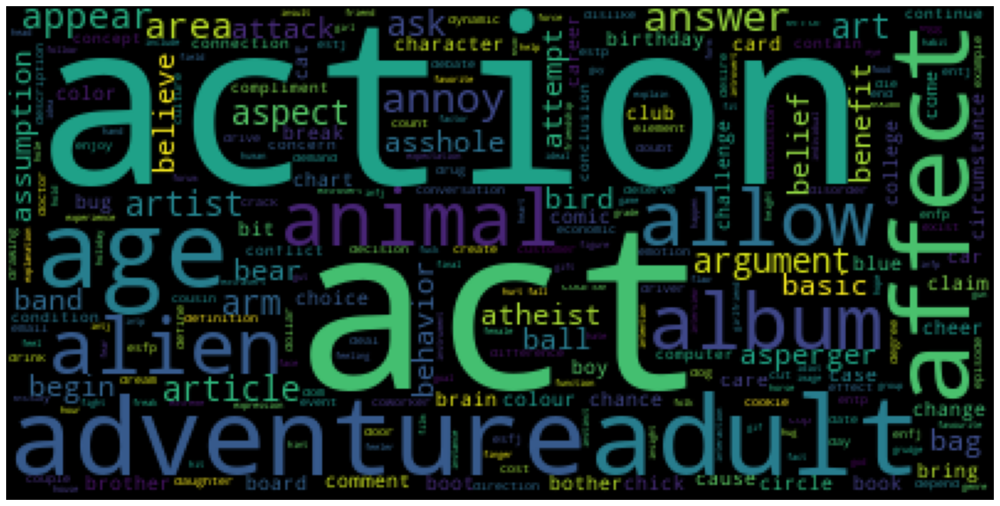

In [ ]:
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[110:3500]))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [36]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['T/F']=='T'].posts)

TfidfVectorizer(max_features=5000, stop_words='english')

In [37]:
Pers_df_Thinking = Pers_df[Pers_df['T/F']=='T']


In [ ]:
#Finding the most common words in Thinking posts.
words = list(Pers_df_Thinking["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 26157),
 ("I'm", 23719),
 ('think', 19706),
 ('people', 15743),
 ('would', 15479),
 ('know', 13143),
 ('get', 13002),
 ('really', 12270),
 ('one', 12024),
 ('-', 10404),
 ('The', 9482),
 ("I've", 8807),
 ('much', 8029),
 ('want', 7668),
 ('time', 7633),
 ('see', 7620),
 ('say', 7547),
 ('something', 7029),
 ('feel', 6944),
 ('good', 6900),
 ('make', 6881),
 ('things', 6608),
 ('If', 6505),
 ('It', 6420),
 ('always', 6204),
 ('could', 6192),
 ('even', 6140),
 ('find', 6099),
 ('way', 6058),
 ('never', 5952),
 ('But', 5819),
 ('go', 5639),
 ('also', 5596),
 ('someone', 5587),
 ('lot', 5582),
 ('You', 5562),
 ('love', 5482),
 ('it.', 5356),
 ("It's", 5251),
 ('going', 5194),
 ("can't", 5180),
 ('pretty', 4948),
 ('need', 4941),
 ('actually', 4745),
 ('type', 4742),
 ('And', 4722),
 ('sure', 4436),
 ('My', 4435),
 ('me.', 4273),
 ('got', 4261)]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



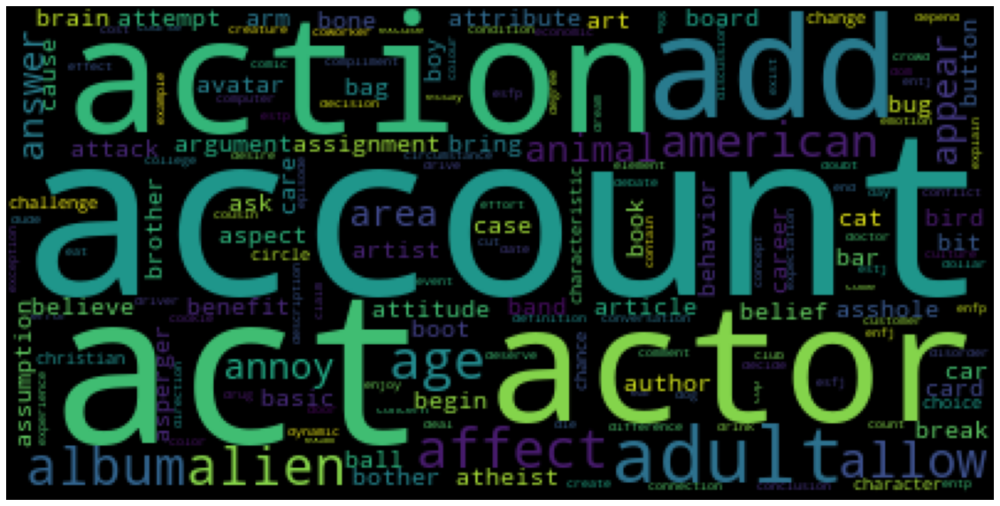

In [51]:
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[110:3500]))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [38]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['T/F']=='F'].posts)

TfidfVectorizer(max_features=5000, stop_words='english')

In [39]:
Pers_df_Feeling = Pers_df[Pers_df['T/F']=='F']

In [ ]:
#Finding the most common words in Feeling posts.
words = list(Pers_df_Feeling["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)


[('like', 35233),
 ("I'm", 33620),
 ('think', 26523),
 ('people', 19803),
 ('really', 19099),
 ('know', 17987),
 ('would', 17126),
 ('get', 15946),
 ('one', 14768),
 ('feel', 14467),
 ("I've", 12964),
 ('-', 12815),
 ('love', 11221),
 ('much', 10935),
 ('The', 10746),
 ('want', 10248),
 ('time', 9850),
 ('always', 9292),
 ('say', 9269),
 ('see', 9214),
 ('good', 8978),
 ('things', 8909),
 ('something', 8434),
 ('It', 8125),
 ('lot', 8091),
 ('But', 8055),
 ('make', 7889),
 ('way', 7643),
 ('could', 7624),
 ('even', 7601),
 ('someone', 7524),
 ('never', 7448),
 ('find', 7261),
 ('also', 7207),
 ("It's", 7136),
 ('go', 6870),
 ('And', 6690),
 ('going', 6461),
 ('You', 6240),
 ("can't", 6239),
 ('My', 6173),
 ('pretty', 6158),
 ('If', 6100),
 ('it.', 5943),
 ('need', 5839),
 ('me.', 5812),
 ('type', 5704),
 ('actually', 5696),
 ('sure', 5490),
 ('thing', 5448)]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



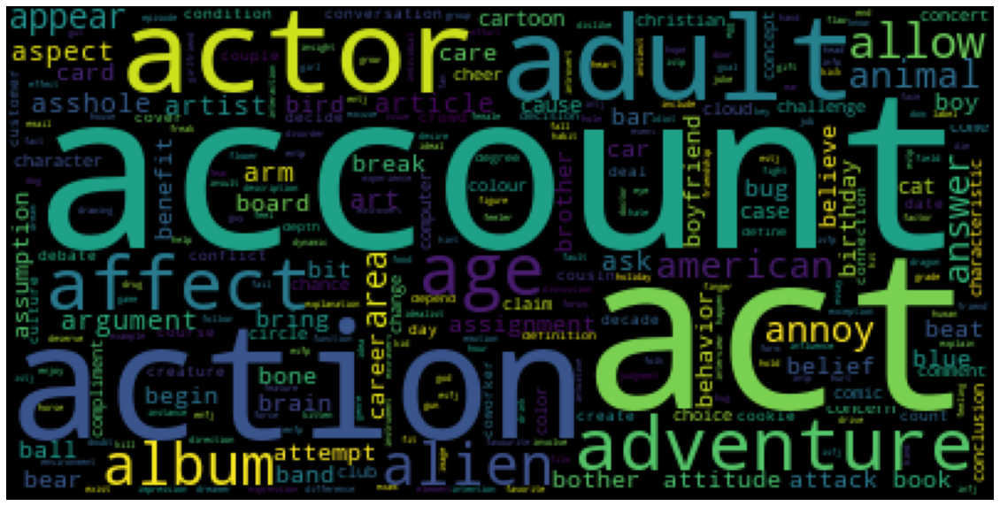

In [ ]:
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[110:3500]))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [40]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['J/P']=='J'].posts)

TfidfVectorizer(max_features=5000, stop_words='english')

In [41]:
Pers_df_Judging = Pers_df[Pers_df['J/P']=='J']

In [ ]:
#Finding the most common words in Judging posts.
words = list(Pers_df_Judging["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 23639),
 ("I'm", 22293),
 ('think', 18102),
 ('people', 14296),
 ('would', 13175),
 ('know', 12514),
 ('really', 11637),
 ('get', 11118),
 ('one', 10589),
 ('-', 9459),
 ("I've", 8673),
 ('feel', 8509),
 ('The', 8230),
 ('much', 7492),
 ('want', 7105),
 ('time', 7090),
 ('say', 6957),
 ('see', 6931),
 ('something', 6260),
 ('good', 6251),
 ('things', 6248),
 ('love', 6192),
 ('always', 6136),
 ('make', 5975),
 ('It', 5886),
 ('could', 5514),
 ('find', 5502),
 ('someone', 5490),
 ('way', 5419),
 ('But', 5397),
 ('even', 5384),
 ('lot', 5314),
 ('If', 5249),
 ('never', 5172),
 ('also', 5135),
 ('You', 4909),
 ("It's", 4902),
 ('go', 4792),
 ('going', 4648),
 ('And', 4554),
 ('need', 4495),
 ('it.', 4419),
 ('My', 4410),
 ('type', 4363),
 ("can't", 4329),
 ('INFJ', 4134),
 ('me.', 4086),
 ('sure', 4031),
 ('pretty', 4015),
 ('actually', 3982)]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



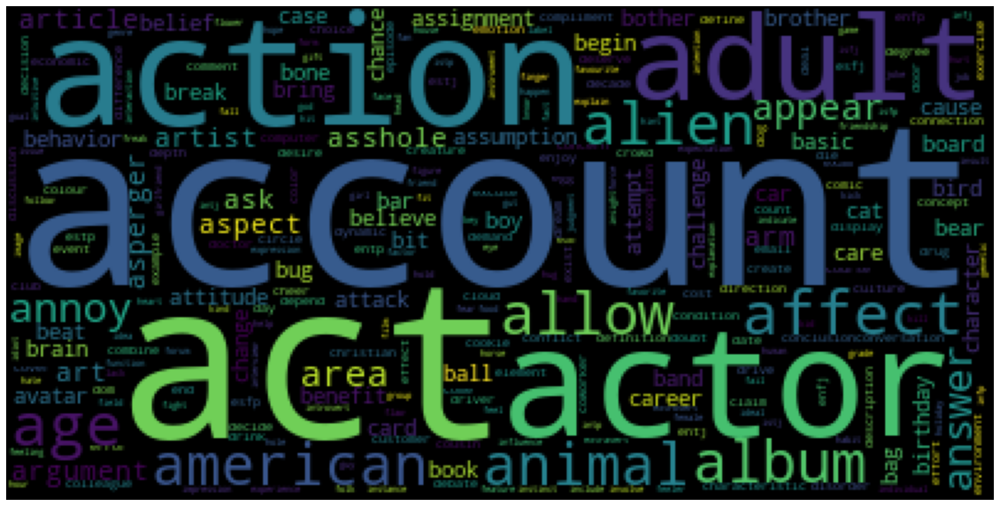

In [ ]:
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[110:3500]))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [42]:
vectorizer=TfidfVectorizer(max_features=5000,stop_words='english')
vectorizer.fit(Pers_df[Pers_df['J/P']=='P'].posts)

TfidfVectorizer(max_features=5000, stop_words='english')

In [43]:
Pers_df_Perceiving = Pers_df[Pers_df['J/P']=='P']

In [ ]:
#Finding the most common words in Perceiving posts.
words = list(Pers_df_Perceiving["posts"].apply(lambda x: x.split()))
words = [x for y in words for x in y]
Counter(words).most_common(50)

[('like', 37751),
 ("I'm", 35046),
 ('think', 28127),
 ('people', 21250),
 ('really', 19732),
 ('would', 19430),
 ('know', 18616),
 ('get', 17830),
 ('one', 16203),
 ('-', 13760),
 ("I've", 13098),
 ('feel', 12902),
 ('The', 11998),
 ('much', 11472),
 ('want', 10811),
 ('love', 10511),
 ('time', 10393),
 ('see', 9903),
 ('say', 9859),
 ('good', 9627),
 ('always', 9360),
 ('things', 9269),
 ('something', 9203),
 ('make', 8795),
 ('It', 8659),
 ('But', 8477),
 ('lot', 8359),
 ('even', 8357),
 ('could', 8302),
 ('way', 8282),
 ('never', 8228),
 ('find', 7858),
 ('go', 7717),
 ('also', 7668),
 ('someone', 7621),
 ("It's", 7485),
 ('If', 7356),
 ('pretty', 7091),
 ("can't", 7090),
 ('going', 7007),
 ('You', 6893),
 ('it.', 6880),
 ('And', 6858),
 ('actually', 6459),
 ('need', 6285),
 ('My', 6198),
 ('type', 6083),
 ('got', 6039),
 ('me.', 5999),
 ('sure', 5895)]

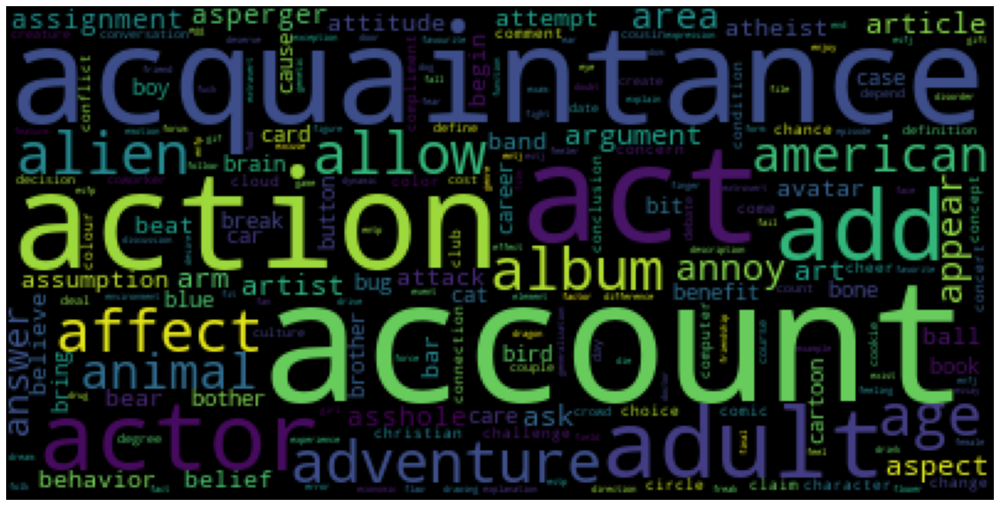

In [ ]:
feature_names=vectorizer.get_feature_names()
wc=WordCloud(max_words=400)
wc.generate(' '.join(word for word in feature_names[110:3500]))
plt.figure(figsize=(20,15))
plt.axis('off')
plt.imshow(wc)

In [44]:
Pers_df

,type,posts,I/E,N/S,T/F,J/P
0,INFJ,' intj moments sportscenter top ten plays pr...,I,N,F,J
1,ENTP,'I'm finding lack posts alarming.|||Sex boring...,E,N,T,P
2,INTP,"'Good one _____ course, say know; that's bles...",I,N,T,P
3,INTJ,"'Dear INTP, enjoyed conversation day. Esoteric...",I,N,T,J
4,ENTJ,'You're fired.|||That's another silly misconce...,E,N,T,J
...,...,...,...,...,...,...
8670,ISFP,' always think cats Fi doms reason. websites ...,I,S,F,P
8671,ENFP,'So...if thread already exists someplace else ...,E,N,F,P
8672,INTP,'So many questions things. would take purple p...,I,N,T,P
8673,INFP,'I conflicted right comes wanting children. ho...,I,N,F,P


In [45]:
Pers_df_I_E = Pers_df.drop(['N/S','T/F','J/P','type'],axis=1)

In [46]:
Pers_df_I_E=pd.get_dummies(Pers_df_I_E,columns=["I/E"])

In [47]:
Pers_df_I_E=Pers_df_I_E.drop(['I/E_E'],axis=1)

In [48]:
x = Pers_df_I_E.drop(["I/E_I"],axis=1)

In [49]:
x

,posts
0,' intj moments sportscenter top ten plays pr...
1,'I'm finding lack posts alarming.|||Sex boring...
2,"'Good one _____ course, say know; that's bles..."
3,"'Dear INTP, enjoyed conversation day. Esoteric..."
4,'You're fired.|||That's another silly misconce...
...,...
8670,' always think cats Fi doms reason. websites ...
8671,'So...if thread already exists someplace else ...
8672,'So many questions things. would take purple p...
8673,'I conflicted right comes wanting children. ho...


In [50]:
y = Pers_df_I_E["I/E_I"]

In [51]:
y

0       1
1       0
2       1
3       1
4       0
       ..
8670    1
8671    0
8672    1
8673    1
8674    1
Name: I/E_I, Length: 8675, dtype: uint8

In [52]:
target= y

In [53]:
xtrain, xtest,ytrain,ytest = train_test_split(x,y,test_size = 0.2 , random_state = 21)

In [ ]:
#Train a regularized logistic regression model using grid search

#Define model parameters to search over
params = {'C':[0.0001,0.001,0.01,0.1,1,10,100,250,500,750,1000],'penalty':['l1','l2']}

#Define model
model = LogisticRegression(solver='liblinear')

#Define gridsearch - how many CVs (10) and what your scoring method will be (AUC) 
clf = GridSearchCV(model,params, cv=10,scoring='roc_auc')

#Run the gridsearch
clf.fit(xtrain,ytrain)

#Print results
clf.cv_results_

In [54]:
#Feature Engineering
Pers_df_I_E.head()

,posts,I/E_I
0,' intj moments sportscenter top ten plays pr...,1
1,'I'm finding lack posts alarming.|||Sex boring...,0
2,"'Good one _____ course, say know; that's bles...",1
3,"'Dear INTP, enjoyed conversation day. Esoteric...",1
4,'You're fired.|||That's another silly misconce...,0


In [55]:
# Converting MBTI personality (or target or Y feature) into numerical form using Label Encoding
# encoding personality type
enc = LabelEncoder()
Pers_df['type of encoding'] = enc.fit_transform(Pers_df['type'])

target = Pers_df['type of encoding']
lemmatizer = WordNetLemmatizer()

In [56]:
import nltk
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
import sklearn.cluster as cluster
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedKFold

In [57]:
train_post=vectorizer.transform(xtrain.posts).toarray()
test_post=vectorizer.transform(xtest.posts).toarray()

In [61]:
model_log=LogisticRegression(max_iter=3000,C=0.5,n_jobs=-1)
model_log.fit(train_post,ytrain)

LogisticRegression(C=0.5, max_iter=3000, n_jobs=-1)

In [58]:
# Vectorizing the posts for the model and filtering Stop-words
vect = CountVectorizer(stop_words='english') 

# Converting posts (or training or X feature) into numerical form by count vectorization
xtrain =  vect.fit_transform(Pers_df_I_E["posts"])

In [59]:
accuracies = {}

In [60]:
# Logistic Regression
logreg = LogisticRegression()
logreg.fit(train_post, ytrain)

Y_pred = logreg.predict(test_post)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest, predictions)
accuracies['Logistic Regression'] = accuracy* 100.0
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 85.01%


In [ ]:
#Random Forest
RFparams={'n_estimators':[5000],'max_features':['auto',None],
'max_depth':randint(1,10),'min_samples_leaf':randint(1,10),
'class_weight':[None,'balanced']}
RFmod = RandomForestClassifier(random_state=0)

In [ ]:
clfRF = RandomizedSearchCV(RFmod,RFparams,#model and parameters
cv=3,#number of cross validation folds
scoring='roc_auc',#accuracy metric
n_iter=2)#number of random parameter combinations
clfRF.fit(train_post,ytrain)
clfRF.best_score_

In [ ]:
#Random Forest
random_forest = RandomForestClassifier(n_estimators=5000, random_state = 1)
random_forest.fit(train_post, ytrain)

# make predictions for test data
Y_pred = random_forest.predict(test_post)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest, predictions)
accuracies['Random Forest'] = accuracy* 100.0 
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 78.04%


In [75]:
#XG boost Classifier
xgb = XGBClassifier()
xgb.fit(train_post, ytrain)

Y_pred = xgb.predict(test_post)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest, predictions)
accuracies['XG Boost'] = accuracy* 100.0
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 85.19%


In [65]:
posts_vectorized = vectorizer.transform(x.posts).toarray()
posts_vectorized.shape

(8675, 5000)

In [1]:
#Choose models
LR = LogisticRegression(solver = 'lbfgs', max_iter = 1000)
RF = RandomForestClassifier()
XGB = XGBClassifier()
#Choose set of hyperparams
params1 = {'C':[0.001,0.01,0.1,1,10]}
params2 = {'n_estimators': [10, 100, 250, 500, 1000]}
params3 = {'learning_rate': [0.001, 0.01, 0.1, 1]}

#Lists to store R-squared
lr_score = []
rf_score = []
xgb_score = []

#Repetitions
reps = range(3)
for rep in reps:    
    #Kfold loop
    kf = KFold(3,random_state=rep,shuffle=True)
    for train_index, test_index in kf.split(posts_vectorized):

        #Get the training and testing sets
        xtrain, xtest = posts_vectorized[train_index], posts_vectorized[test_index]
        ytrain, ytest = target[train_index], target[test_index]
        #Train/test LogisticRegression
        clf_logreg = GridSearchCV(LR, params1, cv=3)
        clf_logreg.fit(xtrain,ytrain)
        lr_score.append(clf_logreg.best_estimator_.score(xtest,ytest))
        
        #Train/test RandomForest
        clf_random_forest = GridSearchCV(RF, params2, cv=3)
        clf_random_forest.fit(xtrain,ytrain)
        rf_score.append(clf_random_forest.best_estimator_.score(xtest,ytest))
        
        #Train/test XGBoost
        clf_xgb = GridSearchCV(XGB, params3, cv=3)
        clf_xgb.fit(xtrain,ytrain)
        xgb_score.append(clf_xgb.best_estimator_.score(xtest,ytest))
        
        
    
#Print average R-squared
print('LR average R-squared:', np.mean(lr_score))
print('RandomForest average R-squared:', np.mean(rf_score))
print('XGBoost average R-squared:', np.mean(xgb_score))

NameError: name 'LogisticRegression' is not defined

In [61]:
def random_xgb(posts_vectorized,target):
    params_XGB = {'learning_rate': [0.001, 0.01, 0.1]}
    KF = RepeatedKFold(n_splits=3 ,n_repeats=2, random_state=1)
    cvs_xgb=[]
    for train_index, test_index in KF.split(posts_vectorized):
        xtrain, xtest = posts_vectorized[train_index], posts_vectorized[test_index]
        ytrain, ytest = target[train_index], target[test_index]
        XGB = XGBClassifier()

        clf= GridSearchCV(XGB,params_XGB, cv=3,scoring='roc_auc',refit=True,)
        clf.fit(xtrain,ytrain)
        
        cvs_xgb.append(clf.best_estimator_.score(xtest,ytest))
    return cvs_random

In [2]:
IE_XGB_Score = random_xgb(posts_vectorized,target)

NameError: name 'posts_vectorized' is not defined

In [ ]:
def random_lr(posts_vectorized,target):
    params_LR = {'C':[0.01,1,10]}
    KF = RepeatedKFold(n_splits=3 ,n_repeats=2, random_state=1)
    cvs_lr=[]
    for train_index, test_index in KF.split(posts_vectorized):
        xtrain, xtest = posts_vectorized[train_index], posts_vectorized[test_index]
        ytrain, ytest = target[train_index], target[test_index]
        LR = LogisticRegression(solver = 'lbfgs', max_iter = 1000)

        clf= GridSearchCV(LR,params_LR, cv=3,scoring='roc_auc',refit=True,)
        clf.fit(xtrain,ytrain)
        
        cvs_lr.append(clf.best_estimator_.score(xtest,ytest))
    return cvs_lr

In [ ]:
IE_XGB_Score = random_lr(posts_vectorized,target)

In [82]:
random(posts_vectorized,target)

[0.7707373271889401,
 0.7350230414746544,
 0.761520737327189,
 0.7569124423963134,
 0.7730414746543779,
 0.7600922722029988,
 0.7773933102652826,
 0.7854671280276817,
 0.790080738177624,
 0.7854671280276817,
 0.7638248847926268,
 0.7465437788018433,
 0.7592165898617511,
 0.7776497695852534,
 0.7868663594470046,
 0.7785467128027682,
 0.7635524798154556,
 0.776239907727797,
 0.7739331026528259,
 0.7693194925028836,
 0.7764976958525346,
 0.7753456221198156,
 0.7868663594470046,
 0.7534562211981567,
 0.7845622119815668,
 0.7635524798154556,
 0.7681660899653979,
 0.748558246828143,
 0.7808535178777394,
 0.7577854671280276]

In [72]:
test_post.shape


(1735, 5000)

In [ ]:
def random(posts_vectorized,target):
    RFparams2={'n_estimators':[1000],
          'min_samples_split':[14],
          'min_samples_leaf': [9],
           'max_features': [2],
           'max_depth': [130],
           'bootstrap': [True]}
    KF = RepeatedKFold(n_splits=10 ,n_repeats=3, random_state=1)
    cvs_random=[]
    for train_index, test_index in KF.split(posts_vectorized):
        xtrain, xtest = posts_vectorized[train_index], posts_vectorized[test_index]
        ytrain, ytest = target[train_index], target[test_index]
        rf = RandomForestClassifier(random_state = 21)

        clf= GridSearchCV(rf,RFparams2, cv=3,scoring='roc_auc',refit=True,)
        clf.fit(xtrain,ytrain)
        
        cvs_random.append(clf.best_estimator_.score(xtest,ytest))
    return cvs_random

In [67]:
#N-S PERSONALITY
Pers_df_N_S = Pers_df.drop(['I/E','T/F','J/P','type'],axis=1)
Pers_df_N_S=pd.get_dummies(Pers_df_N_S,columns=["N/S"])
Pers_df_N_S=Pers_df_N_S.drop(['N/S_S'],axis=1)
x_NS = Pers_df_N_S.drop(["N/S_N"],axis=1)
y_NS = Pers_df_N_S["N/S_N"]

In [68]:
x_NS

,posts,type of encoding
0,' intj moments sportscenter top ten plays pr...,8
1,'I'm finding lack posts alarming.|||Sex boring...,3
2,"'Good one _____ course, say know; that's bles...",11
3,"'Dear INTP, enjoyed conversation day. Esoteric...",10
4,'You're fired.|||That's another silly misconce...,2
...,...,...
8670,' always think cats Fi doms reason. websites ...,13
8671,'So...if thread already exists someplace else ...,1
8672,'So many questions things. would take purple p...,11
8673,'I conflicted right comes wanting children. ho...,9


In [74]:
y_NS

0       1
1       1
2       1
3       1
4       1
       ..
8670    0
8671    1
8672    1
8673    1
8674    1
Name: N/S_N, Length: 8675, dtype: uint8

In [70]:
xtrain_NS, xtest_NS,ytrain_NS,ytest_NS = train_test_split(x_NS,y_NS,test_size = 0.2 , random_state = 21)

In [71]:
train_post_NS=vectorizer.transform(xtrain_NS.posts).toarray()
test_post_NS=vectorizer.transform(xtest_NS.posts).toarray()

In [72]:
# Vectorizing the posts for the model and filtering Stop-words
vect_NS = CountVectorizer(stop_words='english') 

# Converting posts (or training or X feature) into numerical form by count vectorization
xtrain_NS =  vect.fit_transform(Pers_df_N_S["posts"])

In [ ]:
# Logistic Regression
logreg_NS = LogisticRegression()
logreg_NS.fit(train_post_NS, ytrain_NS)

Y_pred = logreg_NS.predict(test_post_NS)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest_NS, predictions)
accuracies['Logistic Regression'] = accuracy* 100.0
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 89.39%


In [ ]:
# XG Boost
model_xgb=XGBClassifier(n_estimators=50,learning_rate=0.5)
model_xgb.fit(train_post_NS,ytrain_NS)

Y_pred = model_xgb.predict(test_post_NS)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest_NS, predictions)
accuracies['XGB Classifier'] = accuracy* 100.0
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 90.09%


In [ ]:
#Random Forest
RFparams={'n_estimators':[1000],'max_features':['auto',None],
'max_depth':randint(1,10),'min_samples_leaf':randint(1,10),
'class_weight':[None,'balanced']}
RFmod = RandomForestClassifier(random_state=0)

In [ ]:
RFmod.fit(train_post_NS,ytrain_NS)

# make predictions for test data
Y_pred = RFmod.predict(test_post_NS)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest_NS, predictions)
accuracies['Random Forest'] = accuracy* 100.0 
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 86.97%


In [73]:
posts_vectorized_NS = vectorizer.transform(x_NS.posts).toarray()
posts_vectorized_NS.shape

(8675, 5000)

In [75]:
def random_xgb_NS(posts_vectorized_NS,y_NS):
    params_XGB = {'learning_rate': [0.1]}
    KF = RepeatedKFold(n_splits=2 ,n_repeats=2, random_state=1)
    cvs_xgb_NS=[]
    for train_index, test_index in KF.split(posts_vectorized_NS):
        xtrain_NS, xtest_NS = posts_vectorized_NS[train_index], posts_vectorized[test_index]
        ytrain_NS, ytest_NS = y_NS[train_index], y_NS[test_index]
        XGB = XGBClassifier()

        clf= GridSearchCV(XGB,params_XGB, cv=3,scoring='roc_auc',refit=True,)
        clf.fit(xtrain_NS,ytrain_NS)
        
        cvs_xgb.append(clf.best_estimator_.score(xtest_NS,ytest_NS))
    return cvs_xgb_NS

In [ ]:
NS_XGB_Score = random_xgb_NS(posts_vectorized_NS,y_NS)

/Users/shivamsrivastav/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


In [ ]:
#J-P PERSONALITY
Pers_df_J_P = Pers_df.drop(['I/E','T/F','N/S','type'],axis=1)
Pers_df_J_P=pd.get_dummies(Pers_df_J_P,columns=["J/P"])
Pers_df_J_P=Pers_df_J_P.drop(['J/P_P'],axis=1)
x_JP = Pers_df_J_P.drop(["J/P_J"],axis=1)
y_JP = Pers_df_J_P["J/P_J"]

In [ ]:
x_JP

,posts,type of encoding
0,' intj moments sportscenter top ten plays pr...,8
1,'I'm finding lack posts alarming.|||Sex boring...,3
2,"'Good one _____ course, say know; that's bles...",11
3,"'Dear INTP, enjoyed conversation day. Esoteric...",10
4,'You're fired.|||That's another silly misconce...,2
...,...,...
8670,' always think cats Fi doms reason. websites ...,13
8671,'So...if thread already exists someplace else ...,1
8672,'So many questions things. would take purple p...,11
8673,'I conflicted right comes wanting children. ho...,9


In [ ]:
xtrain_JP, xtest_JP,ytrain_JP,ytest_JP = train_test_split(x_JP,y_JP,test_size = 0.2 , random_state = 21)

In [ ]:
train_post_JP=vectorizer.transform(xtrain_JP.posts).toarray()
test_post_JP=vectorizer.transform(xtest_JP.posts).toarray()

In [ ]:
# Vectorizing the posts for the model and filtering Stop-words
vect_JP = CountVectorizer(stop_words='english') 

# Converting posts (or training or X feature) into numerical form by count vectorization
xtrain_JP =  vect.fit_transform(Pers_df_J_P["posts"])

In [ ]:
# Logistic Regression - JP
logreg_JP = LogisticRegression()
logreg_JP.fit(train_post_JP, ytrain_JP)

Y_pred = logreg_JP.predict(test_post_NS)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest_JP, predictions)
accuracies['Logistic Regression'] = accuracy* 100.0
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 79.88%


In [ ]:
#Random Forest - JP
RFparams={'n_estimators':[1000],'max_features':['auto',None],
'max_depth':randint(1,10),'min_samples_leaf':randint(1,10),
'class_weight':[None,'balanced']}
RFmod = RandomForestClassifier(random_state=0)

In [ ]:
RFmod.fit(train_post_JP,ytrain_JP)

# make predictions for test data
Y_pred = RFmod.predict(test_post_JP)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest_JP, predictions)
accuracies['Random Forest'] = accuracy* 100.0 
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 72.05%


In [ ]:
# XG Boost - JP
model_xgb=XGBClassifier(n_estimators=50,learning_rate=0.5)
model_xgb.fit(train_post_JP,ytrain_JP)

Y_pred = model_xgb.predict(test_post_JP)
predictions = [round(value) for value in Y_pred]

# evaluate predictions
accuracy = accuracy_score(ytest_JP, predictions)
accuracies['XGB Classifier'] = accuracy* 100.0
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 79.71%
